In [1]:
import pandas as pd
import numpy as np
import calendar
import seaborn as sns
import pandas.api.types as ptypes
from meteostat import Point, Daily,Hourly
from geopy.geocoders import Nominatim
import time
from pprint import pprint
from datetime import datetime
import myutils

In [2]:
#visual settings
%matplotlib inline
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from pandas.plotting import register_matplotlib_converters

sns.set(style='whitegrid',palette='muted',font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#93D30C", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 14, 10
register_matplotlib_converters()


In [3]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Preliminary explorative analysis

In [4]:
data = pd.read_csv('Data\Processed\HACCP.csv')
temp = pd.read_csv('Data\Processed\Temp.csv')
site_data = pd.read_csv('Data\Raw\Dinosol_Site_Information.csv',sep=';')

In [5]:
data = data.loc[data['PropertyName']=='HACCP']

In [6]:
data = data.sort_values(ascending=True, by='Timetag')
data.head(5)

,Unnamed: 0,SiteID,SiteName,AssetID,AssetName,PointID,PointName,DataValue,Timetag,Units,PropertyName
764803,764803,89244,9322 La Grama (SM),89505,044:SM.Charcuteria 1.2,547977,SM.Charcuteria 1.2: u17 Ther Air,1,2020-09-01 00:00:00.000,°C,HACCP
747527,747527,89244,9322 La Grama (SM),89504,019:I.Congelados 2.2,548174,I.Congelados 2.2: u17 Ther Air,-20,2020-09-01 00:00:00.000,°C,HACCP
14700003,97,67336,9600 Plataforma Telde (SM),67352,011:CONG. Red Antecamara,420681,011:Red Antecamara: u17 Ther Air,"4,8",2020-09-01 00:00:00.000,°C,HACCP
782102,782102,89244,9322 La Grama (SM),89506,010:C.Congelados,548127,C.Congelados: u17 Ther Air,-18,2020-09-01 00:00:00.000,°C,HACCP
799401,799401,89244,9322 La Grama (SM),89507,017:C.I.Congelados 4,548222,C.I.Congelados 4: u17 Ther Air,"-17,4",2020-09-01 00:00:00.000,°C,HACCP


In [7]:
#Timetag should change to Datetime and DataValue to float in order to use them for further analysis
data['Timetag'] = pd.to_datetime(data['Timetag'])
data['DataValue'] = data['DataValue'].apply(lambda x: float(x.split()[0].replace(',', '.')))
#data['PointName']=[i[:-15] for i in data['PointName']]

In [8]:
#Test whether the attributes have the desired data types
assert ptypes.is_datetime64_any_dtype(data['Timetag'])
assert ptypes.is_numeric_dtype(data['DataValue'])

In [9]:
data.SiteID.value_counts()

89244    2139222
89259    1943449
89247    1718856
67336    1258286
Name: SiteID, dtype: int64

# Temperature data preprocessing

In [10]:
temp.head()

,Unnamed: 0,ID,SiteID,SiteName,AssetID,AssetName,ParameterName,ParameterValue,ParameterUnits,PropertyName
0,0,8924789435076:V Aves: u69 Sair TempLOWTEMP-3,89247,Dinosol 9303,89435,076:V Aves,076:V Aves: u69 Sair Temp,-3,°C,LOWTEMP
1,1,8924789435076:V Aves: u69 Sair TempHIGHTEMP8,89247,Dinosol 9303,89435,076:V Aves,076:V Aves: u69 Sair Temp,8,°C,HIGHTEMP
2,2,8924789454019:CB CONG Pescado: u17 Ther AirLO...,89247,Dinosol 9303,89454,019:CB CONG Pescado,019:CB CONG Pescado: u17 Ther Air,-21,°C,LOWTEMP
3,3,8924789454019:CB CONG Pescado: u17 Ther AirHI...,89247,Dinosol 9303,89454,019:CB CONG Pescado,019:CB CONG Pescado: u17 Ther Air,-15,°C,HIGHTEMP
4,4,8924789448083:M Fruta-Verdura 1: u17 Ther Air...,89247,Dinosol 9303,89448,083:M Fruta-Verdura 1,083:M Fruta-Verdura 1: u17 Ther Air,1,°C,LOWTEMP


In [11]:
#temp['ParameterName']=[i[:-15] for i in temp['ParameterName']]

In [11]:
temp = temp.pivot_table(values='ParameterValue',index='AssetName',columns='PropertyName')

In [12]:
groups = { 'freezer':-21, 
            'fish/meat': -3,
            'fruits':1,
            'milk':0}

In [13]:
conditions = [
    (temp['LOWTEMP'] == -21), (temp['LOWTEMP'] ==-3 ),
    (temp['LOWTEMP'] == 1), (temp['LOWTEMP'] == 0)
   
    ]

# create a list of the values we want to assign for each condition
values = ['freezer', 'fish/meat', 'fruits', 'milk/charcuterie']

# create a new column and use np.select to assign values to it using our lists as arguments
temp['group'] = np.select(conditions, values)

        


In [14]:
import os
if os.path.exists("Data\Processed\\temp_groups.csv"):
    print ("file exists")
else:
    temp.to_csv('Data\Processed\Temp_groups.csv')


file exists


In [14]:
temp

PropertyName,HIGHTEMP,LOWTEMP,group
AssetName,,,
001:C.CONGELADOS,-15,-21,freezer
001:CONG. Red Almacen.1,-15,-21,freezer
002:C CONGELADOS,-15,-21,freezer
002:C.PAN CONGELADO,-15,-21,freezer
002:CONG.Grupo Almacen.1,-15,-21,freezer
...,...,...,...
Muelle Charc-fruta 1,6,1,fruits
Muelle Fruta,10,5,0
Muelle Fruta 2 tras,10,5,0


# Site info

In [15]:
data.SiteName.value_counts()

9322 La Grama (SM)             2139222
9338 Valle San Lorenzo (SM)    1943449
9303 Aulaga (SM)               1718856
9600 Plataforma Telde (SM)     1258286
Name: SiteName, dtype: int64

In [16]:
site = site_data[['NAME','DISPLAYNAME','SITENAME','ADDRESS1','ADDRESS2','ADDRESS3','POSTCODE','COUNTRY']][site_data['SITENAME']=='Dinosol 9303']
site['Full Address'] = site['ADDRESS3'].map(str) + ', ' + site['POSTCODE'].map(str) + ', ' + site['COUNTRY'].map(str)
site

,NAME,DISPLAYNAME,SITENAME,ADDRESS1,ADDRESS2,ADDRESS3,POSTCODE,COUNTRY,Full Address
63,Dinosol,Dinosol 9303 Aulaga,Dinosol 9303,"Calle Isla Graciosa, s/n",NaN,Puerto del Rosario,35600,ES,"Puerto del Rosario, 35600, ES"


In [17]:
# instantiate a new Nominatim client
app = Nominatim(user_agent="Getloc")
address = site['Full Address'].iloc[0]
#address = 'San Cristobal de La Lagun, 38260, ES'
location =myutils.location.get_location_by_address(address,app)
latitude = location["lat"]
longitude = location["lon"]
name = location['display_name']
print(f"{latitude}, {longitude},{name}")
# print all returned data
#pprint(location)

28.4993424, -13.8599051,Puerto del Rosario, Las Palmas, Canarias, España


# Weather data 

In [18]:
#weather['Date time'] = pd.to_datetime(weather['Date time'])
# weather_lorenzo = pd.read_csv('weather_data_SL_010920_300421.csv')
# weather_lorenzo['Date time'] = pd.to_datetime(weather_lorenzo['Date time'])
# Set time period (year-month-day)
start = datetime(2020, 9, 1)
end = datetime(2021, 8, 31)

# Create Point 
location = Point(float(latitude),float(longitude), 70)

# Get daily data for 1 year
weather = Daily(location, start, end)
weather = weather.fetch()
weather

,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
time,,,,,,,,,,
2020-09-01,22.7,18.9,25.1,0.0,NaN,71.7,10.4,NaN,1012.8,NaN
2020-09-02,23.4,22.0,26.0,0.0,NaN,24.8,15.5,NaN,1013.1,NaN
2020-09-03,23.2,21.9,25.7,0.0,NaN,44.4,18.6,NaN,1014.4,NaN
2020-09-04,23.2,20.0,27.1,0.0,NaN,29.5,17.2,NaN,1017.2,NaN
2020-09-05,23.3,19.1,31.4,0.0,NaN,12.8,15.6,NaN,1015.9,NaN
...,...,...,...,...,...,...,...,...,...,...
2021-08-27,23.2,21.0,26.0,0.0,NaN,23.0,20.3,NaN,1016.2,NaN
2021-08-28,23.6,21.0,26.5,0.0,NaN,27.6,19.3,NaN,1017.5,NaN
2021-08-29,23.8,21.3,26.2,0.0,NaN,21.7,18.3,NaN,1017.0,NaN


# Exploratory Analysis

In [19]:
site_data= data[data['SiteID']==89247]
print(site_data.shape)

(1718856, 11)


In [23]:
site_data.head()

,Unnamed: 0,SiteID,SiteName,AssetID,AssetName,PointID,PointName,DataValue,Timetag,Units,PropertyName
243686,243686,89247,9303 Aulaga (SM),89457,069:CSM Carniceria,547811,069:CSM Carniceria: u17 Ther Air,1.8,2020-09-01 00:05:00,°C,HACCP
226262,226262,89247,9303 Aulaga (SM),89456,079:M Lacteos 2,547793,079:M Lacteos 2: u17 Ther Air,5.1,2020-09-01 00:05:00,°C,HACCP
208838,208838,89247,9303 Aulaga (SM),89455,071:SM Carniceria 2,547704,071:SM Carniceria 2: u17 Ther Air,4.5,2020-09-01 00:05:00,°C,HACCP
261110,261110,89247,9303 Aulaga (SM),89458,077:M Pescaderia,547672,077:M Pescaderia: u17 Ther Air,4.6,2020-09-01 00:05:00,°C,HACCP
278527,278527,89247,9303 Aulaga (SM),89459,063:CSM Charcuteria,547840,063:CSM Charcuteria: u17 Ther Air,3.5,2020-09-01 00:05:00,°C,HACCP


In [ ]:
site=myutils.time_expand.time(site_data,'Timetag')

In [25]:
#Choose only relevant columns (Check whether the same AssetID are across the stores)
site_distribution = site[['AssetID','AssetName','DataValue','Date','Hour','Weekday','Month','Hour_of_week']].sort_values(ascending=True,by='Date')
site_distribution.head(10)


,AssetID,AssetName,DataValue,Date,Hour,Weekday,Month,Hour_of_week
243686,89457,069:CSM Carniceria,1.8,2020-09-01,0,Tuesday,Sep,24
348319,89463,061:SM Charcuteria 1,9.2,2020-09-01,16,Tuesday,Sep,40
539813,89483,064:SM Quesos 2,4.6,2020-09-01,16,Tuesday,Sep,40
522389,89481,078:M Lacteos 1,6.6,2020-09-01,16,Tuesday,Sep,40
243782,89457,069:CSM Carniceria,6.0,2020-09-01,16,Tuesday,Sep,40
208933,89455,071:SM Carniceria 2,4.9,2020-09-01,15,Tuesday,Sep,39
278622,89459,063:CSM Charcuteria,5.4,2020-09-01,15,Tuesday,Sep,39
156829,89451,073:V Charcuteria 1,6.3,2020-09-01,16,Tuesday,Sep,40
504964,89480,070:SM Carniceria 1,4.0,2020-09-01,15,Tuesday,Sep,39
34943,89438,065:SM Quesos 3,6.5,2020-09-01,15,Tuesday,Sep,39


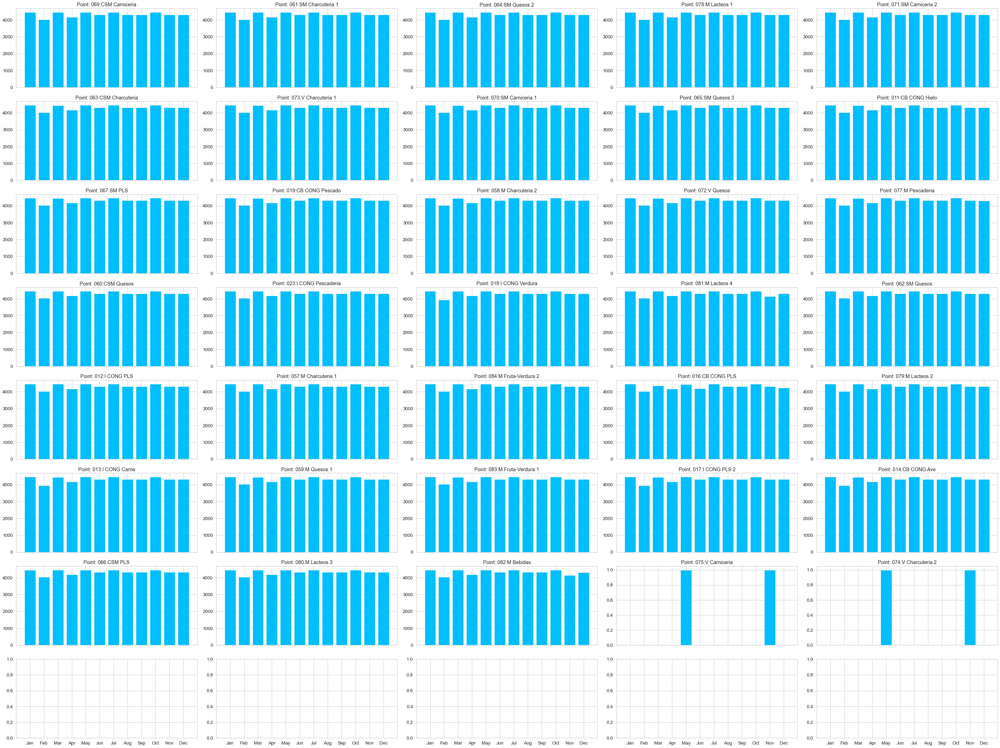

In [26]:
myutils.plots.distribution_plots(site_distribution,'Month')

## Statistical Analysis

In [27]:
#We get the mean of the values per hour per
def rearrange(df):
    df_new = df.groupby(['AssetID','AssetName','Timetag'])['DataValue'].mean()

    #Convert the pandas series back to dataframe
    df_new = pd.DataFrame(df_new).reset_index()

    #Transpose the data so we get the timetag on the rows (might have to change later on)
    df_new = df_new.pivot_table('DataValue','Timetag','AssetName').reset_index()

    print('The shape of the dataframe is:',df_new.shape)
    df_new.head(20)
    return df_new

In [28]:
site_stat = rearrange(site_data)
site_stat.head(20)

The shape of the dataframe is: (52119, 36)


AssetName,Timetag,011:CB CONG Hielo,012:I CONG PLS,013:I CONG Carne,014:CB CONG Ave,016:CB CONG PLS,017:I CONG PLS 2,018:I CONG Verdura,019:CB CONG Pescado,023:I CONG Pescaderia,...,074:V Charcuteria 2,075:V Carniceria,077:M Pescaderia,078:M Lacteos 1,079:M Lacteos 2,080:M Lacteos 3,081:M Lacteos 4,082:M Bebidas,083:M Fruta-Verdura 1,084:M Fruta-Verdura 2
0,2020-09-01 00:05:00,-17.9,-19.6,-19.8,-13.8,-17.7,-18.0,-21.2,-18.8,-19.6,...,NaN,NaN,4.6,4.6,5.1,4.6,5.8,7.1,4.9,4.9
1,2020-09-01 00:15:00,-18.9,-21.8,-21.5,-13.8,-17.4,-19.1,-20.4,-18.2,-20.5,...,NaN,NaN,4.6,4.6,4.7,4.3,5.5,6.7,3.9,4.9
2,2020-09-01 00:25:00,-18.9,-22.1,-21.5,-13.0,-19.0,-19.1,-20.7,-18.2,-20.2,...,NaN,NaN,4.2,4.3,4.7,4.6,5.5,6.7,4.4,4.6
3,2020-09-01 00:35:00,-19.9,-22.5,-22.1,-13.4,-19.0,-20.5,-21.5,-19.2,-19.2,...,NaN,NaN,3.6,6.1,4.2,4.6,4.9,6.3,5.2,5.0
4,2020-09-01 00:45:00,-20.2,-21.5,-21.6,-14.1,-17.9,-21.0,-22.3,-20.2,-18.8,...,NaN,NaN,3.3,4.0,3.9,9.5,4.2,6.6,5.8,3.8
5,2020-09-01 00:55:00,-19.8,-20.0,-20.4,-12.9,-16.9,-3.8,-3.5,-20.6,-17.5,...,NaN,NaN,3.6,4.5,5.1,11.1,4.7,6.6,5.3,4.9
6,2020-09-01 01:05:00,-18.3,-20.7,-20.8,-12.9,-17.7,8.4,9.8,-19.8,-18.5,...,NaN,NaN,3.9,4.5,5.1,11.7,5.1,6.6,4.7,4.9
7,2020-09-01 01:15:00,-19.1,-21.5,-21.7,-13.8,-17.7,-9.7,-15.3,-20.2,-19.5,...,NaN,NaN,3.9,4.5,4.8,12.0,5.4,6.3,3.9,4.9
8,2020-09-01 01:25:00,-20.5,-19.0,-19.9,-13.8,-17.7,-19.6,-22.5,-19.8,-20.9,...,NaN,NaN,4.2,4.5,5.1,9.8,5.4,6.3,4.5,4.9
9,2020-09-01 01:35:00,-19.5,-19.5,-19.9,-13.8,-18.0,-20.1,-22.5,-19.5,-21.2,...,NaN,NaN,4.2,4.5,5.1,5.8,5.7,6.8,5.9,4.9


# Cleaning

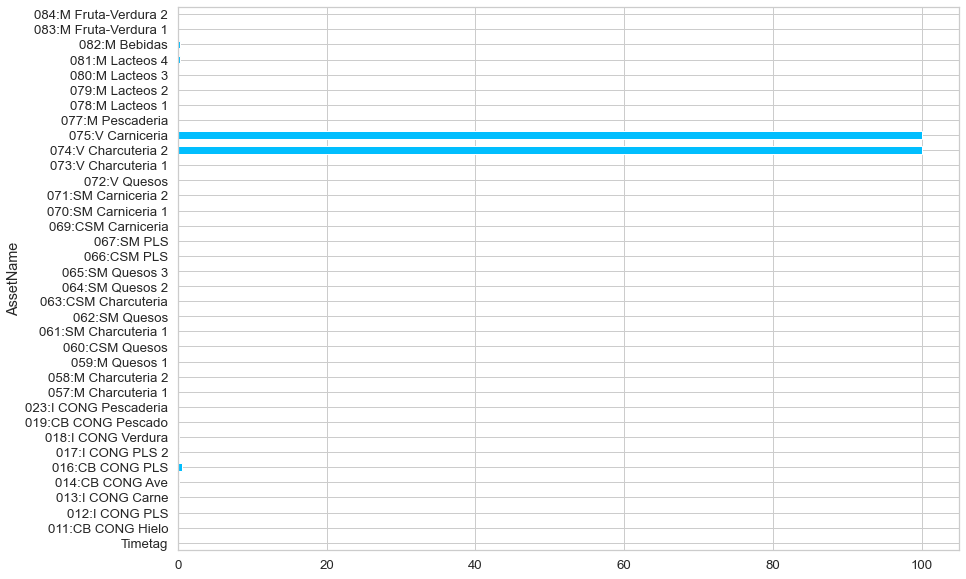

In [29]:
myutils.missing_values.check_nans(site_stat)

In [30]:
print('Shape before cleaning {}'.format(site_stat.shape))
site_stat = myutils.missing_values.drop_columns(site_stat,0.3)
print('Shape after cleaning {}'.format(site_stat.shape))



Shape before cleaning (52119, 36)
Shape after cleaning (52119, 34)


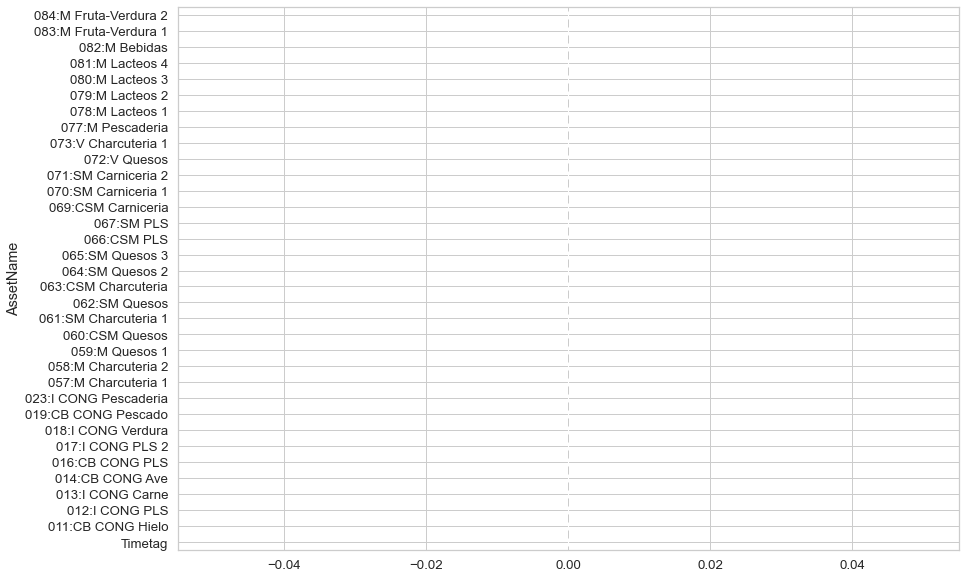

In [31]:
site_stat = myutils.missing_values.fill_nans(site_stat)
myutils.missing_values.check_nans(site_stat)

# Statistical plotting

In [32]:
site_stat = myutils.time_expand.time(site_stat,'Timetag')

In [33]:
site_stat

AssetName,Timetag,011:CB CONG Hielo,012:I CONG PLS,013:I CONG Carne,014:CB CONG Ave,016:CB CONG PLS,017:I CONG PLS 2,018:I CONG Verdura,019:CB CONG Pescado,023:I CONG Pescaderia,...,081:M Lacteos 4,082:M Bebidas,083:M Fruta-Verdura 1,084:M Fruta-Verdura 2,Date,Time,Month,Hour,Weekday,Hour_of_week
0,2020-09-01 00:05:00,-17.9,-19.6,-19.8,-13.8,-17.7,-18.0,-21.2,-18.8,-19.6,...,5.8,7.1,4.9,4.9,2020-09-01,00:05:00,Sep,0,Tuesday,24
1,2020-09-01 00:15:00,-18.9,-21.8,-21.5,-13.8,-17.4,-19.1,-20.4,-18.2,-20.5,...,5.5,6.7,3.9,4.9,2020-09-01,00:15:00,Sep,0,Tuesday,24
2,2020-09-01 00:25:00,-18.9,-22.1,-21.5,-13.0,-19.0,-19.1,-20.7,-18.2,-20.2,...,5.5,6.7,4.4,4.6,2020-09-01,00:25:00,Sep,0,Tuesday,24
3,2020-09-01 00:35:00,-19.9,-22.5,-22.1,-13.4,-19.0,-20.5,-21.5,-19.2,-19.2,...,4.9,6.3,5.2,5.0,2020-09-01,00:35:00,Sep,0,Tuesday,24
4,2020-09-01 00:45:00,-20.2,-21.5,-21.6,-14.1,-17.9,-21.0,-22.3,-20.2,-18.8,...,4.2,6.6,5.8,3.8,2020-09-01,00:45:00,Sep,0,Tuesday,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52114,2021-08-30 23:15:00,-21.9,-25.2,-21.4,-21.0,-17.1,-22.2,-26.6,-18.9,-18.7,...,4.7,6.1,4.1,3.3,2021-08-30,23:15:00,Aug,23,Monday,23
52115,2021-08-30 23:25:00,-20.9,-21.6,-20.2,-18.0,-14.1,-20.1,-25.0,-18.6,-19.7,...,6.3,3.8,3.4,6.0,2021-08-30,23:25:00,Aug,23,Monday,23
52116,2021-08-30 23:35:00,-21.3,-25.0,-21.5,-19.9,-18.5,-22.1,-27.1,-17.9,-21.1,...,6.3,4.5,3.4,5.2,2021-08-30,23:35:00,Aug,23,Monday,23
52117,2021-08-30 23:45:00,-20.9,-25.4,-21.9,-21.4,-16.0,-20.9,-25.8,-18.3,-20.6,...,6.3,6.3,4.7,3.6,2021-08-30,23:45:00,Aug,23,Monday,23


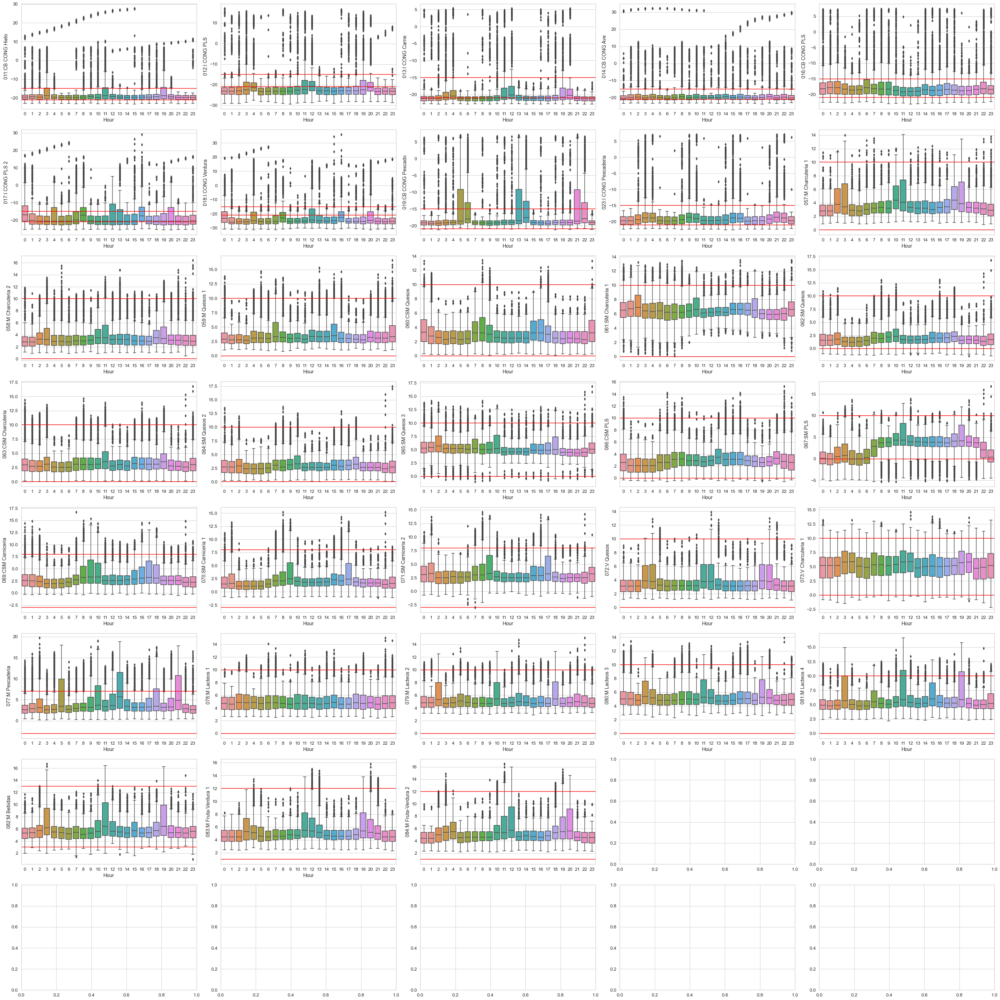

In [34]:
myutils.plots.statistic_plots(site_stat,temp,'box','horizontal','Hour')

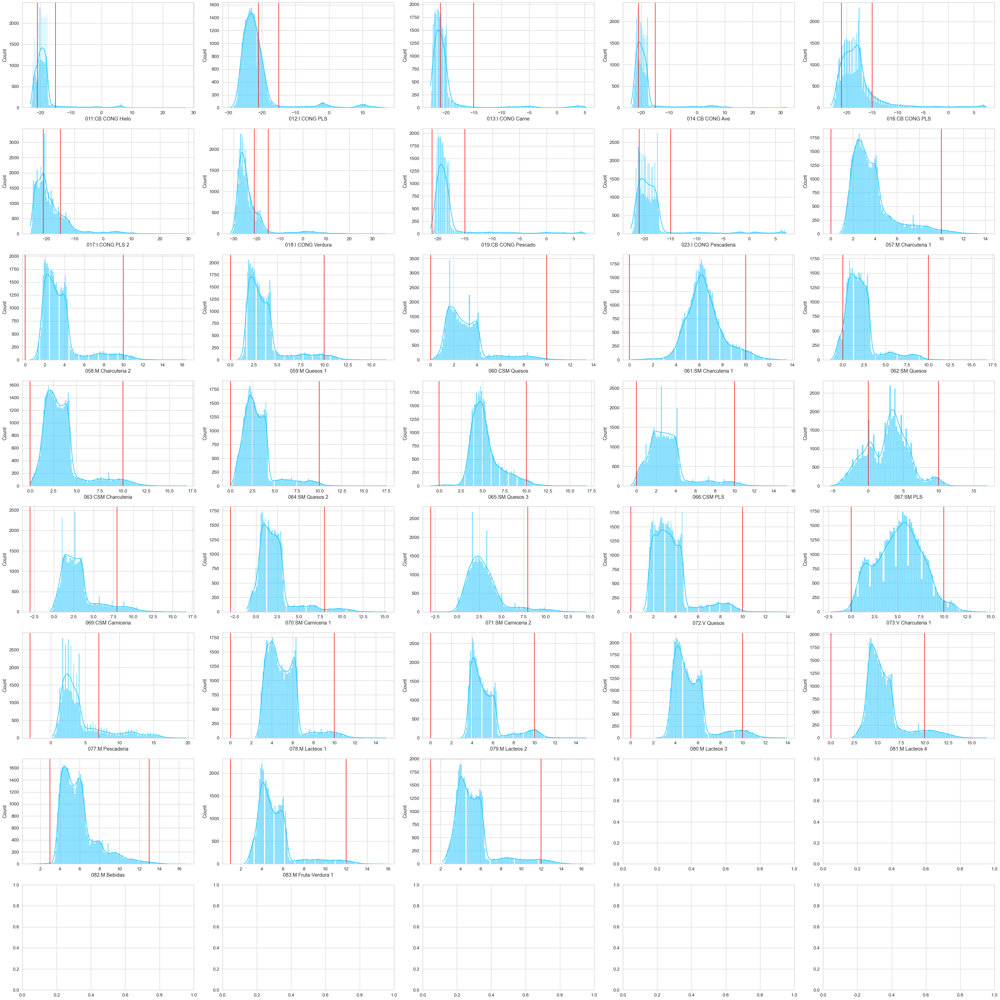

In [35]:
myutils.plots.statistic_plots(site_stat,temp,'hist','vertical','Hour')

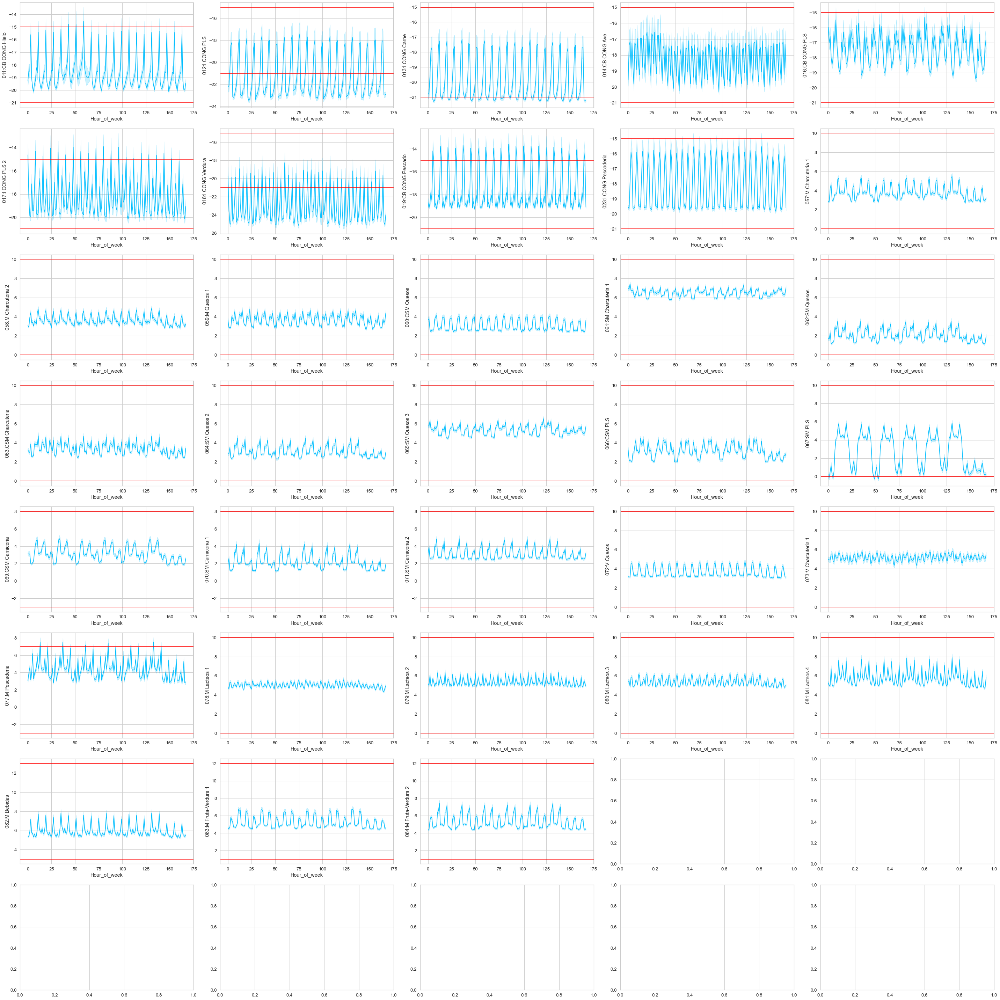

In [36]:
myutils.plots.statistic_plots(site_stat,temp,'line','horizontal','Hour_of_week')

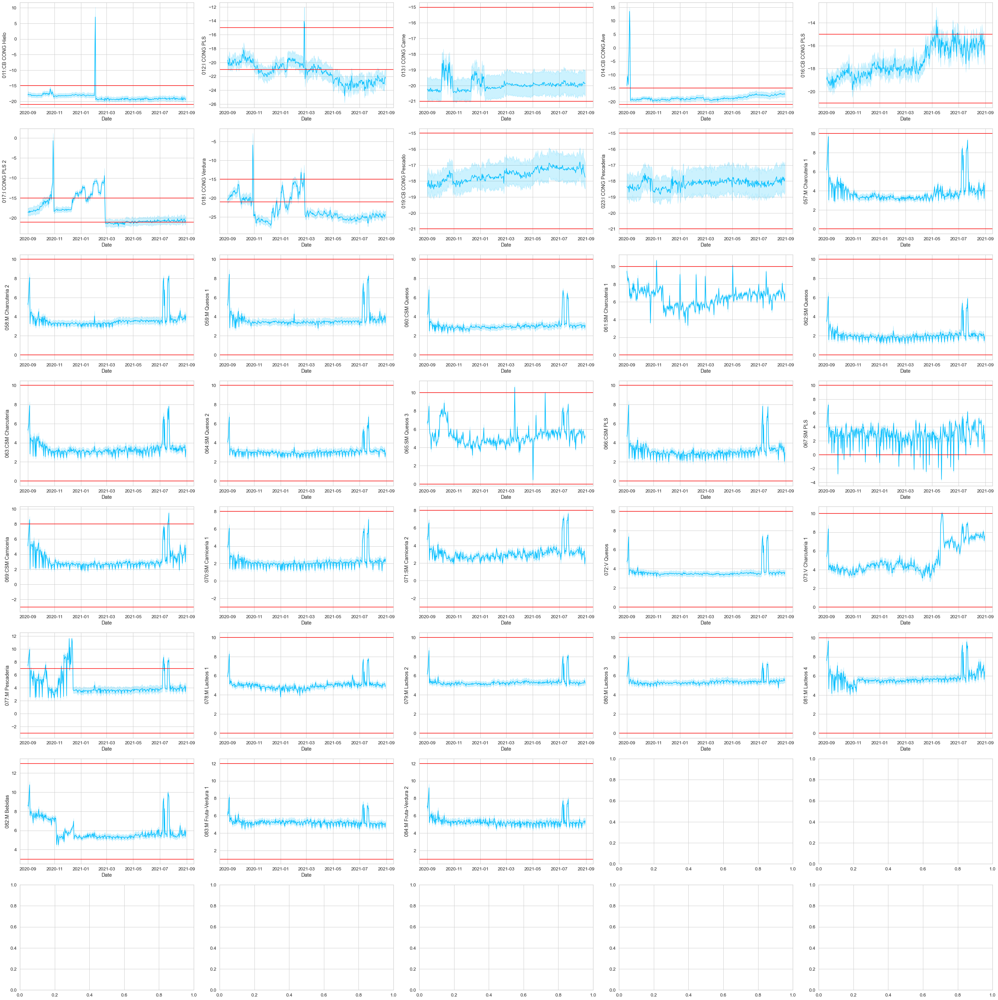

In [37]:
myutils.plots.statistic_plots(site_stat,temp,'line','horizontal','Date')

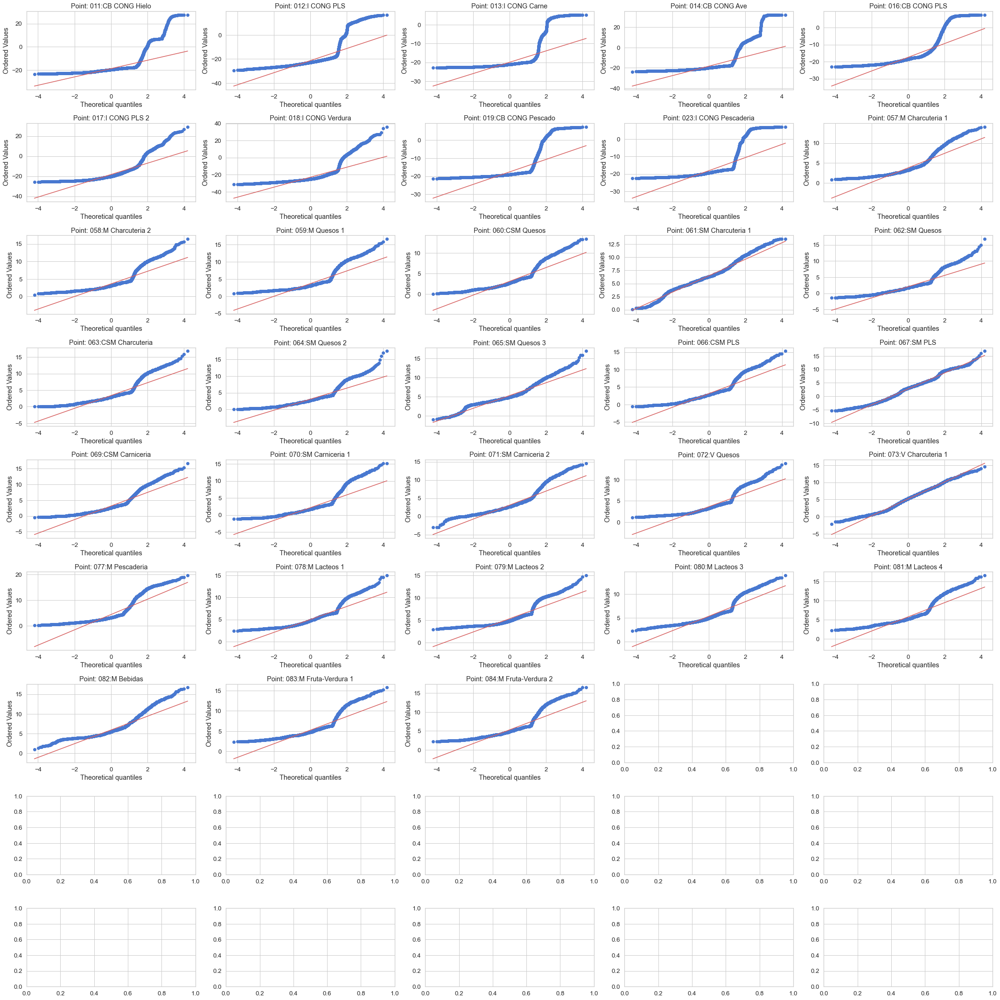

In [38]:
from scipy import stats
f,ax = plt.subplots(9,5,sharex=False)
f.set_figheight(30)
f.set_figwidth(30)
censors = [i for i in site_stat.columns[1:-6]]

for i , point in enumerate(censors):
    axis = ax[i//5, i%5]    
    stats.probplot(site_stat[censors[i]],plot=axis)
    axis.title.set_text("Point: {}".format(point))
f.tight_layout()

# Correaltion

In [39]:
#Check correlation among the datapoint
corr = site_stat[[i for i in site_stat.columns[1:-6]]].corr(method='spearman')
#plt.figure(figsize=(40,40))
#sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,annot=True,cmap='Blues')

In [40]:
c = corr.abs()

s = c.unstack()
so = s.sort_values(ascending=False,kind="quicksort")
correlation = pd.DataFrame(so,columns=['Correlation'])
correlation[correlation['Correlation']!=1].iloc[:10]

,,Correlation
AssetName,AssetName,
071:SM Carniceria 2,070:SM Carniceria 1,0.878375
070:SM Carniceria 1,071:SM Carniceria 2,0.878375
013:I CONG Carne,012:I CONG PLS,0.712730
012:I CONG PLS,013:I CONG Carne,0.712730
017:I CONG PLS 2,018:I CONG Verdura,0.677219
018:I CONG Verdura,017:I CONG PLS 2,0.677219
065:SM Quesos 3,064:SM Quesos 2,0.529599
064:SM Quesos 2,065:SM Quesos 3,0.529599
057:M Charcuteria 1,058:M Charcuteria 2,0.520379


In [63]:
site_stat.head()

AssetName,Timetag,011:CB CONG Hielo,012:I CONG PLS,013:I CONG Carne,014:CB CONG Ave,016:CB CONG PLS,017:I CONG PLS 2,018:I CONG Verdura,019:CB CONG Pescado,023:I CONG Pescaderia,...,081:M Lacteos 4,082:M Bebidas,083:M Fruta-Verdura 1,084:M Fruta-Verdura 2,Date,Time,Month,Hour,Weekday,Hour_of_week
0,2020-09-01 00:05:00,-17.9,-19.6,-19.8,-13.8,-17.7,-18.0,-21.2,-18.8,-19.6,...,5.8,7.1,4.9,4.9,2020-09-01,00:05:00,Sep,0,Tuesday,24
1,2020-09-01 00:15:00,-18.9,-21.8,-21.5,-13.8,-17.4,-19.1,-20.4,-18.2,-20.5,...,5.5,6.7,3.9,4.9,2020-09-01,00:15:00,Sep,0,Tuesday,24
2,2020-09-01 00:25:00,-18.9,-22.1,-21.5,-13.0,-19.0,-19.1,-20.7,-18.2,-20.2,...,5.5,6.7,4.4,4.6,2020-09-01,00:25:00,Sep,0,Tuesday,24
3,2020-09-01 00:35:00,-19.9,-22.5,-22.1,-13.4,-19.0,-20.5,-21.5,-19.2,-19.2,...,4.9,6.3,5.2,5.0,2020-09-01,00:35:00,Sep,0,Tuesday,24
4,2020-09-01 00:45:00,-20.2,-21.5,-21.6,-14.1,-17.9,-21.0,-22.3,-20.2,-18.8,...,4.2,6.6,5.8,3.8,2020-09-01,00:45:00,Sep,0,Tuesday,24


# Check Weather 

In [41]:
site_stat ['Date'] = pd.to_datetime(site_stat['Date'])
site_merged = pd.merge(site_stat,weather['tavg'],left_on='Date',right_index=True)

In [42]:
site_merged.head()

,Timetag,011:CB CONG Hielo,012:I CONG PLS,013:I CONG Carne,014:CB CONG Ave,016:CB CONG PLS,017:I CONG PLS 2,018:I CONG Verdura,019:CB CONG Pescado,023:I CONG Pescaderia,...,082:M Bebidas,083:M Fruta-Verdura 1,084:M Fruta-Verdura 2,Date,Time,Month,Hour,Weekday,Hour_of_week,tavg
0,2020-09-01 00:05:00,-17.9,-19.6,-19.8,-13.8,-17.7,-18.0,-21.2,-18.8,-19.6,...,7.1,4.9,4.9,2020-09-01,00:05:00,Sep,0,Tuesday,24,22.7
1,2020-09-01 00:15:00,-18.9,-21.8,-21.5,-13.8,-17.4,-19.1,-20.4,-18.2,-20.5,...,6.7,3.9,4.9,2020-09-01,00:15:00,Sep,0,Tuesday,24,22.7
2,2020-09-01 00:25:00,-18.9,-22.1,-21.5,-13.0,-19.0,-19.1,-20.7,-18.2,-20.2,...,6.7,4.4,4.6,2020-09-01,00:25:00,Sep,0,Tuesday,24,22.7
3,2020-09-01 00:35:00,-19.9,-22.5,-22.1,-13.4,-19.0,-20.5,-21.5,-19.2,-19.2,...,6.3,5.2,5.0,2020-09-01,00:35:00,Sep,0,Tuesday,24,22.7
4,2020-09-01 00:45:00,-20.2,-21.5,-21.6,-14.1,-17.9,-21.0,-22.3,-20.2,-18.8,...,6.6,5.8,3.8,2020-09-01,00:45:00,Sep,0,Tuesday,24,22.7


In [39]:
#experimental until get data for teh whole year 
#exp = lorenzo_merged.loc[lorenzo_merged['Date'].astype(str)<='2020-12-09']

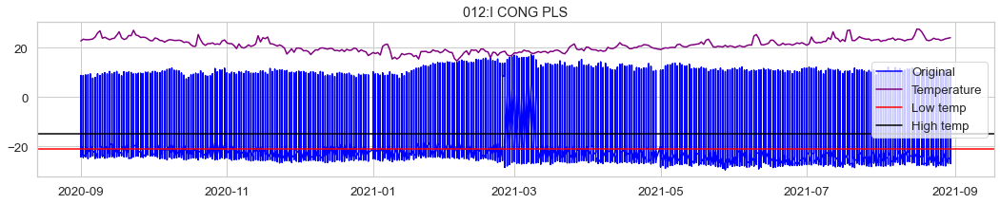

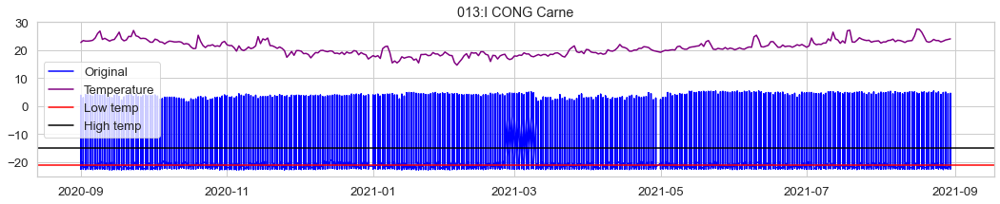

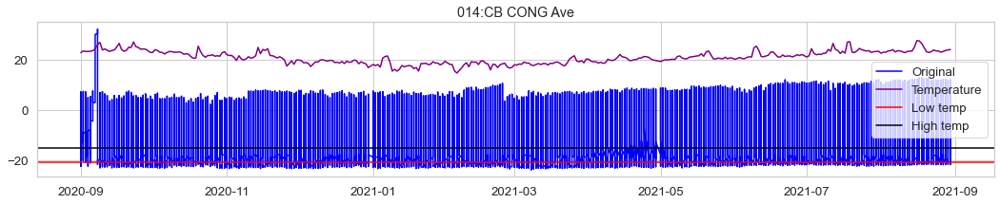

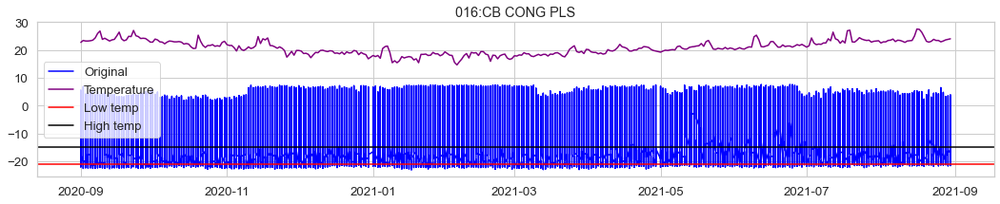

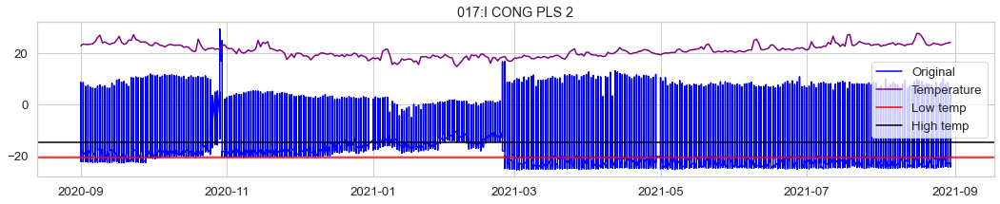

...

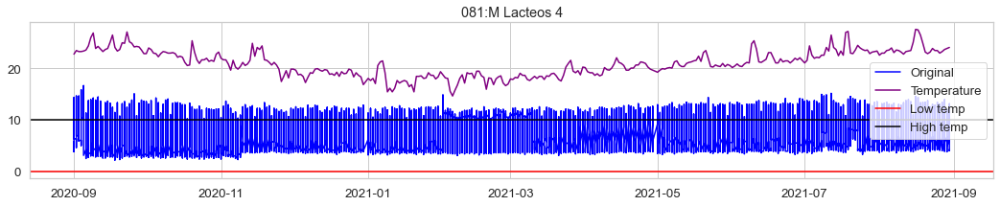

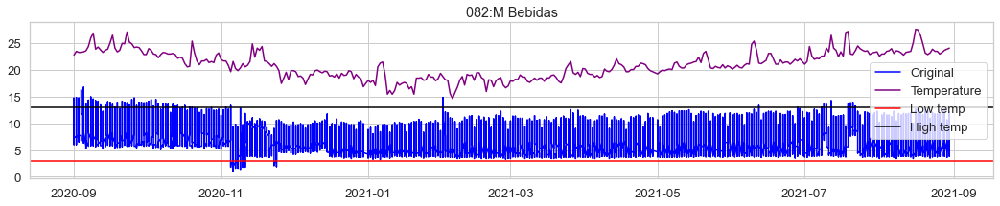

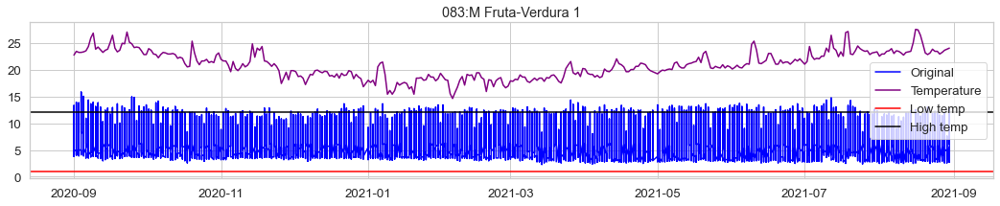

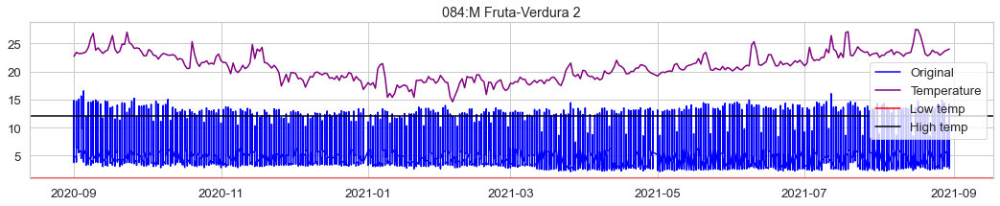

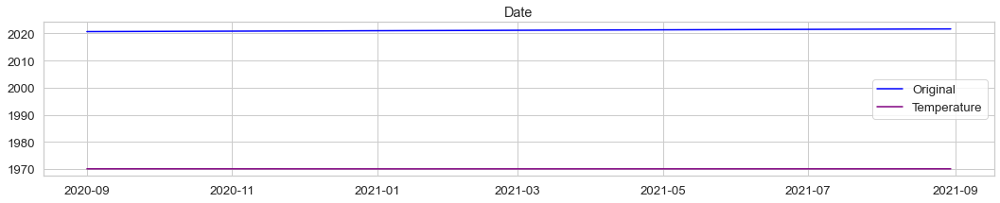

In [43]:
for censor in site_merged.columns[2:-6]:
    _ = plt.figure(figsize=(18,3))
    _ = plt.plot(site_merged['Date'],
                site_merged[censor], color='blue',label='Original')

    _ = plt.plot(site_merged['Date'],
                site_merged['tavg'], color='purple',label='Temperature')

    for k, _ in enumerate(temp.index.values):

            if censor == temp.index.values[k]:

                _ = plt.axhline(temp.LOWTEMP[k],color='Red',linestyle = '-',label='Low temp')
                _ = plt.axhline(temp.HIGHTEMP[k],color='Black',linestyle = '-',label='High temp')
            
    _ = plt.legend(loc='best')
    _ = plt.title(censor)
    plt.show()

In [44]:
site_stat.head()

AssetName,Timetag,011:CB CONG Hielo,012:I CONG PLS,013:I CONG Carne,014:CB CONG Ave,016:CB CONG PLS,017:I CONG PLS 2,018:I CONG Verdura,019:CB CONG Pescado,023:I CONG Pescaderia,...,081:M Lacteos 4,082:M Bebidas,083:M Fruta-Verdura 1,084:M Fruta-Verdura 2,Date,Time,Month,Hour,Weekday,Hour_of_week
0,2020-09-01 00:05:00,-17.9,-19.6,-19.8,-13.8,-17.7,-18.0,-21.2,-18.8,-19.6,...,5.8,7.1,4.9,4.9,2020-09-01,00:05:00,Sep,0,Tuesday,24
1,2020-09-01 00:15:00,-18.9,-21.8,-21.5,-13.8,-17.4,-19.1,-20.4,-18.2,-20.5,...,5.5,6.7,3.9,4.9,2020-09-01,00:15:00,Sep,0,Tuesday,24
2,2020-09-01 00:25:00,-18.9,-22.1,-21.5,-13.0,-19.0,-19.1,-20.7,-18.2,-20.2,...,5.5,6.7,4.4,4.6,2020-09-01,00:25:00,Sep,0,Tuesday,24
3,2020-09-01 00:35:00,-19.9,-22.5,-22.1,-13.4,-19.0,-20.5,-21.5,-19.2,-19.2,...,4.9,6.3,5.2,5.0,2020-09-01,00:35:00,Sep,0,Tuesday,24
4,2020-09-01 00:45:00,-20.2,-21.5,-21.6,-14.1,-17.9,-21.0,-22.3,-20.2,-18.8,...,4.2,6.6,5.8,3.8,2020-09-01,00:45:00,Sep,0,Tuesday,24


# last data preprocessing

In [45]:
#final dataset
site_stat = site_stat.drop(['Weekday','Hour_of_week','Month','Date','Hour','Time'],axis=1)
# lorenzo_stat['Hour'] = pd.to_datetime(lorenzo_stat['Hour'],unit='h').dt.time
# lorenzo_stat['Time'] = pd.to_datetime(lorenzo_stat['Date'].astype(str) + ' ' + lorenzo_stat['Hour'].astype(str))
# lorenzo_stat = lorenzo_stat.drop(['Date','Hour'],axis=1)
site_stat = site_stat.set_index('Timetag')
site_stat.head()

AssetName,011:CB CONG Hielo,012:I CONG PLS,013:I CONG Carne,014:CB CONG Ave,016:CB CONG PLS,017:I CONG PLS 2,018:I CONG Verdura,019:CB CONG Pescado,023:I CONG Pescaderia,057:M Charcuteria 1,...,072:V Quesos,073:V Charcuteria 1,077:M Pescaderia,078:M Lacteos 1,079:M Lacteos 2,080:M Lacteos 3,081:M Lacteos 4,082:M Bebidas,083:M Fruta-Verdura 1,084:M Fruta-Verdura 2
Timetag,,,,,,,,,,,,,,,,,,,,,
2020-09-01 00:05:00,-17.9,-19.6,-19.8,-13.8,-17.7,-18.0,-21.2,-18.8,-19.6,3.7,...,2.5,3.8,4.6,4.6,5.1,4.6,5.8,7.1,4.9,4.9
2020-09-01 00:15:00,-18.9,-21.8,-21.5,-13.8,-17.4,-19.1,-20.4,-18.2,-20.5,2.8,...,4.4,3.5,4.6,4.6,4.7,4.3,5.5,6.7,3.9,4.9
2020-09-01 00:25:00,-18.9,-22.1,-21.5,-13.0,-19.0,-19.1,-20.7,-18.2,-20.2,2.1,...,2.7,3.0,4.2,4.3,4.7,4.6,5.5,6.7,4.4,4.6
2020-09-01 00:35:00,-19.9,-22.5,-22.1,-13.4,-19.0,-20.5,-21.5,-19.2,-19.2,3.2,...,2.7,1.8,3.6,6.1,4.2,4.6,4.9,6.3,5.2,5.0
2020-09-01 00:45:00,-20.2,-21.5,-21.6,-14.1,-17.9,-21.0,-22.3,-20.2,-18.8,3.2,...,4.1,3.9,3.3,4.0,3.9,9.5,4.2,6.6,5.8,3.8


# Dickey-Fuller Test to Ceck Stationarity


In statistics, the Dickey–Fuller test tests the null hypothesis that a unit root is present in an autoregressive model. The alternative hypothesis is different depending on which version of the test is used, but is usually stationarity or trend-stationarity.

Stationary series has constant mean and variance over time. Rolling average and the rolling standard deviation of time series do not change over time.

Dickey-Fuller test
Null Hypothesis (H0): It suggests the time series has a unit root, meaning it is non-stationary. It has some time dependent structure.

Alternate Hypothesis (H1): It suggests the time series does not have a unit root, meaning it is stationary. It does not have time-dependent structure.

p-value > 0.05: Accept the null hypothesis (H0), the data has a unit root and is non-stationary.

p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.

In [46]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import pacf


In [47]:
# rollmean = lorenzo_stat.resample(rule='D').mean()
# rollstd = lorenzo_stat.resample(rule='D').std()
rollmean = site_stat.rolling(window=30).mean()
rollstd = site_stat.rolling(window=30).std()

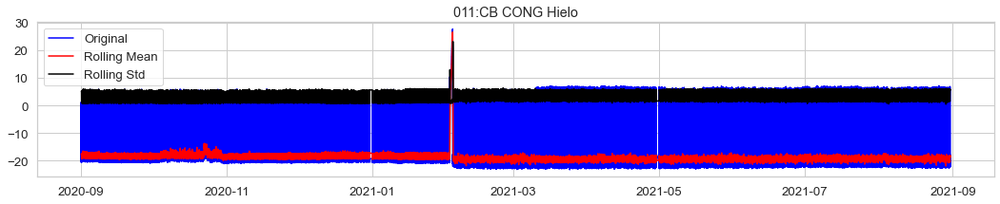

Test Statistic                -1.269068e+01
p-value                        1.133929e-23
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


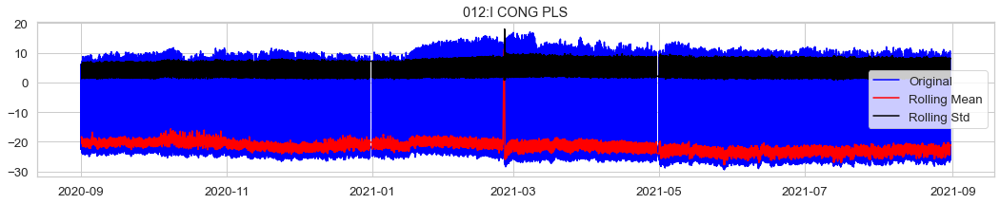

Test Statistic                -1.301284e+01
p-value                        2.546645e-24
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


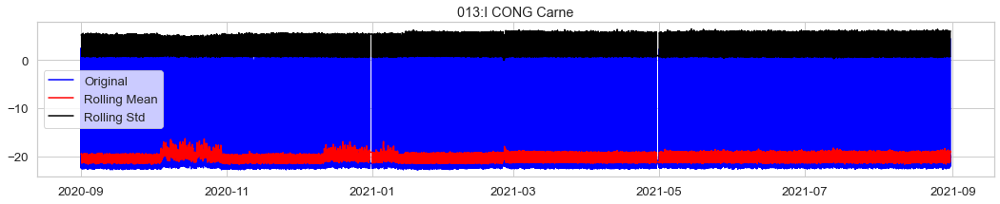

Test Statistic                -1.227658e+01
p-value                        8.405793e-23
#Lags Used                     5.700000e+01
Number of Observations Used    5.206100e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


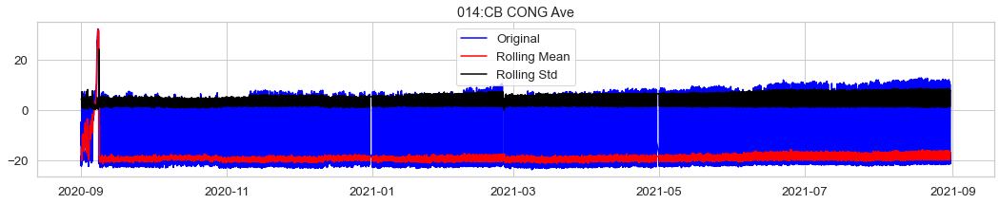

Test Statistic                -1.213133e+01
p-value                        1.733136e-22
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


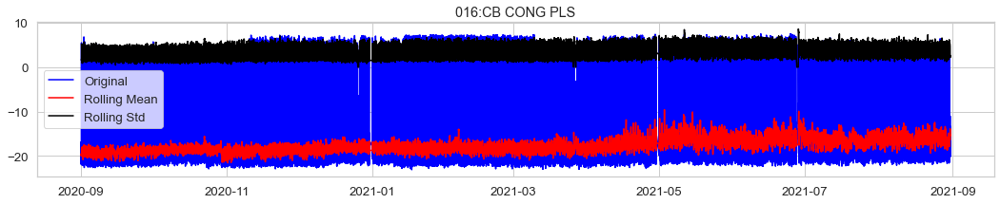

Test Statistic                -1.133434e+01
p-value                        1.093040e-20
#Lags Used                     5.700000e+01
Number of Observations Used    5.206100e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


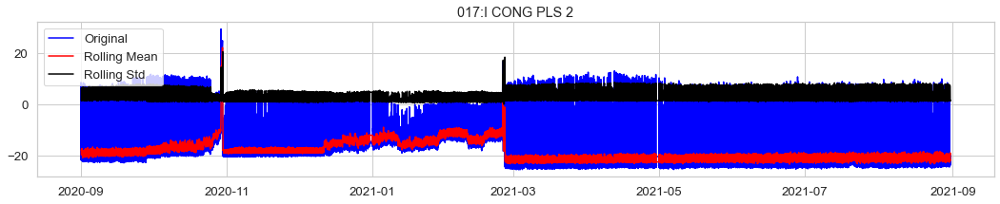

Test Statistic                -6.052532e+00
p-value                        1.267509e-07
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


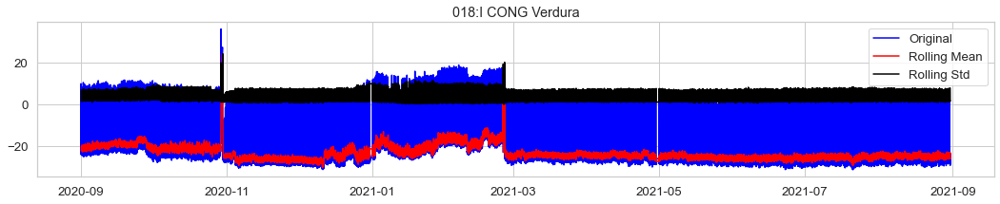

Test Statistic                -7.433144e+00
p-value                        6.283423e-11
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


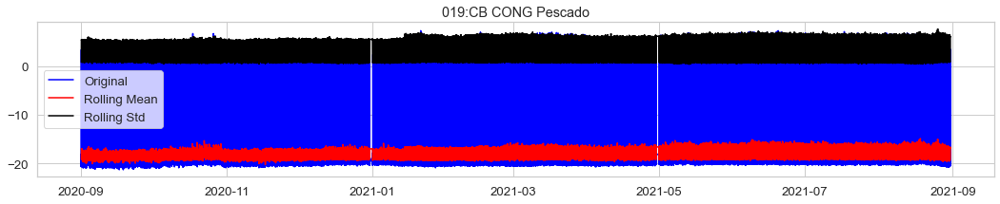

Test Statistic                -1.030728e+01
p-value                        3.253903e-18
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


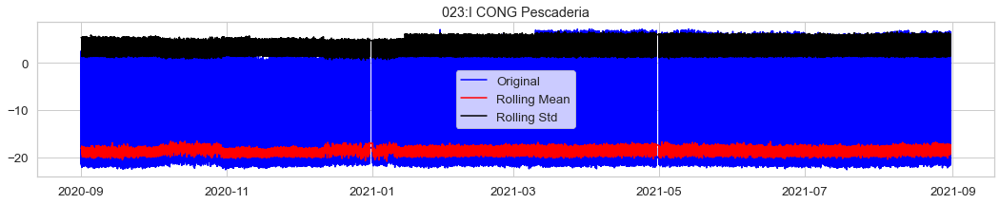

Test Statistic                   -22.495833
p-value                            0.000000
#Lags Used                        58.000000
Number of Observations Used    52060.000000
Critical Value (1%)               -3.430476
Critical Value (5%)               -2.861596
Critical Value (10%)              -2.566800
dtype: float64


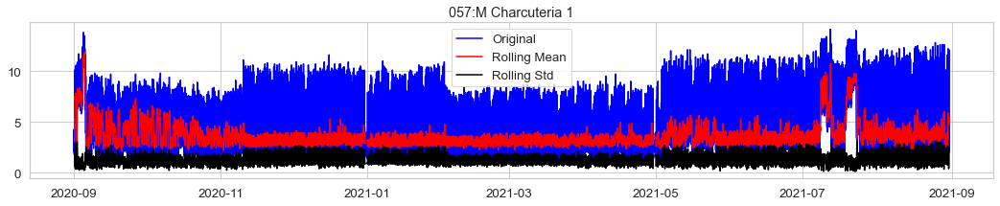

Test Statistic                -1.393833e+01
p-value                        4.944147e-26
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


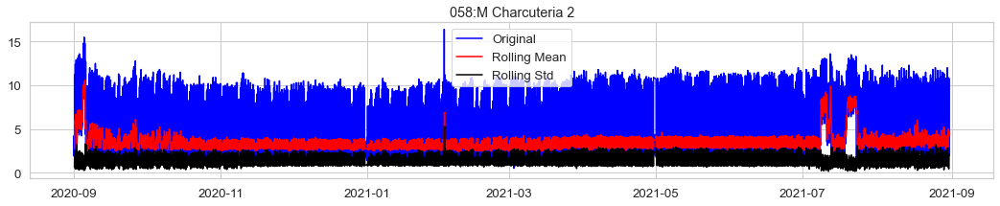

Test Statistic                -1.010513e+01
p-value                        1.034723e-17
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


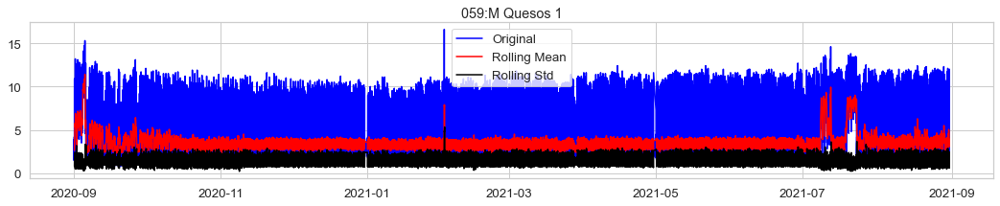

Test Statistic                -1.161609e+01
p-value                        2.447033e-21
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


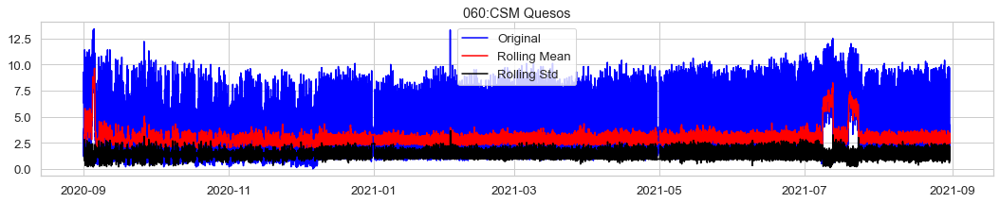

Test Statistic                -9.687452e+00
p-value                        1.160315e-16
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


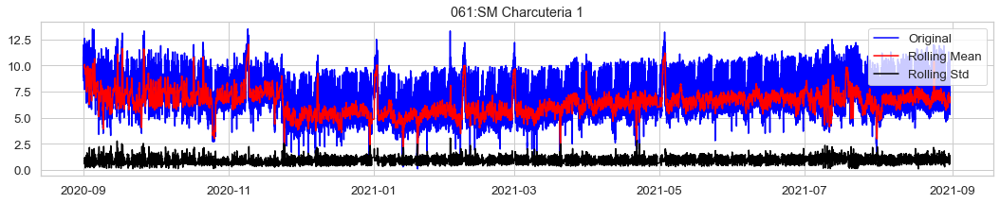

Test Statistic                -1.598094e+01
p-value                        6.836765e-29
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


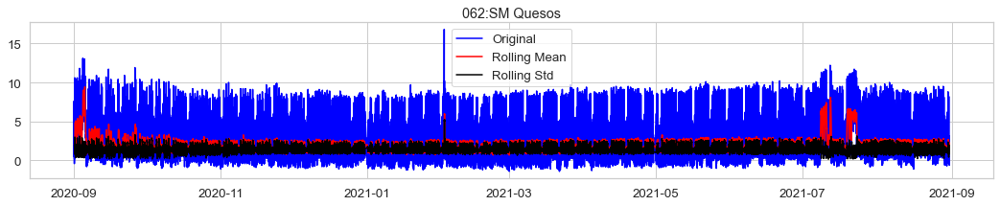

Test Statistic                -1.765269e+01
p-value                        3.713715e-30
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


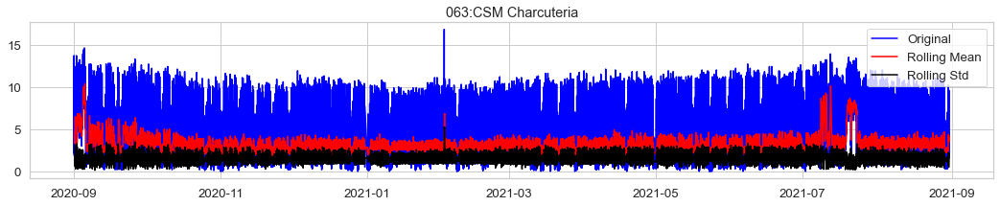

Test Statistic                -1.427867e+01
p-value                        1.335584e-26
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


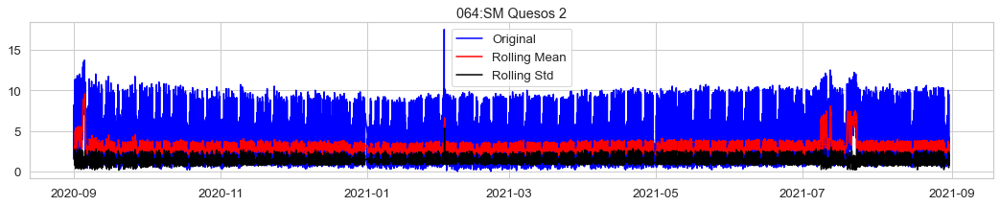

Test Statistic                -1.594540e+01
p-value                        7.459345e-29
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


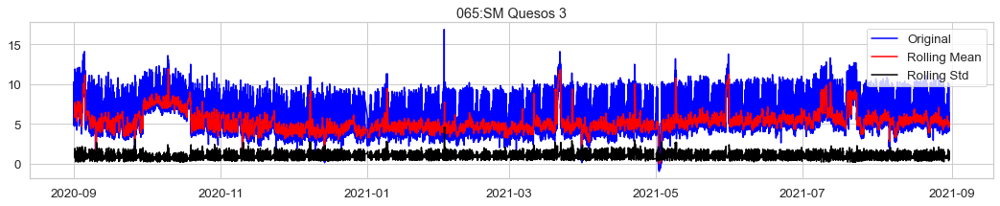

Test Statistic                -1.567045e+01
p-value                        1.515024e-28
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


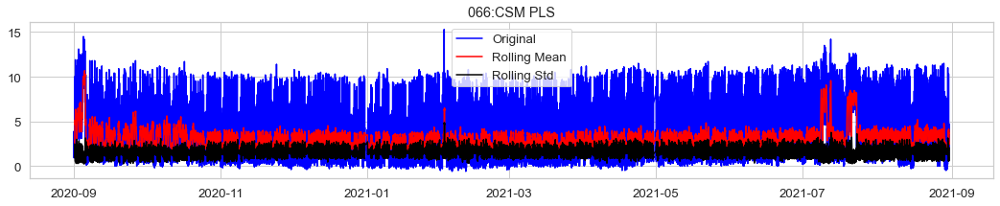

Test Statistic                -1.707526e+01
p-value                        7.774784e-30
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


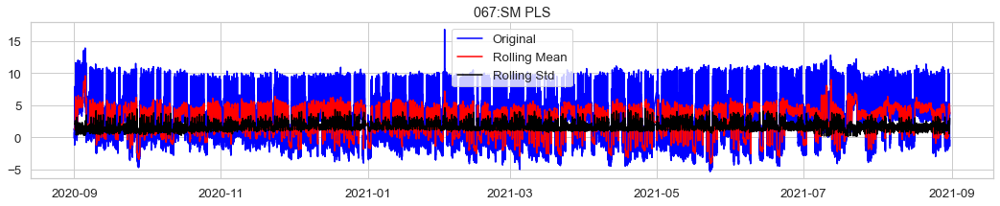

Test Statistic                   -28.925553
p-value                            0.000000
#Lags Used                        58.000000
Number of Observations Used    52060.000000
Critical Value (1%)               -3.430476
Critical Value (5%)               -2.861596
Critical Value (10%)              -2.566800
dtype: float64


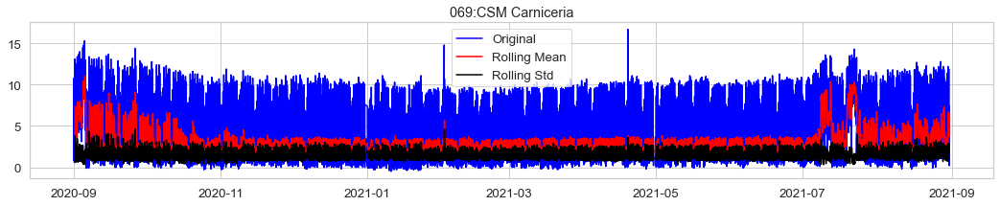

Test Statistic                -1.867170e+01
p-value                        2.044488e-30
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


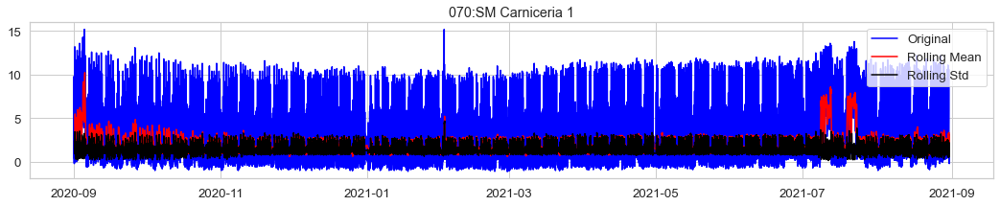

Test Statistic                -1.836426e+01
p-value                        2.224277e-30
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


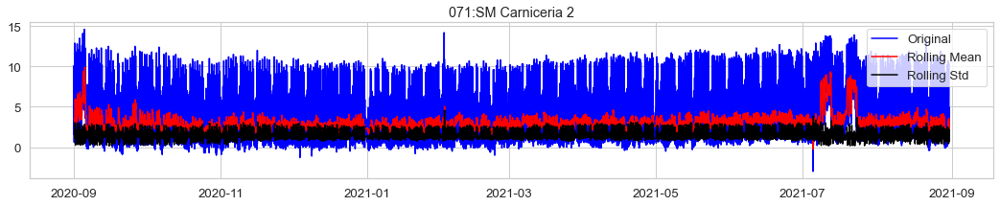

Test Statistic                -1.267710e+01
p-value                        1.209174e-23
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


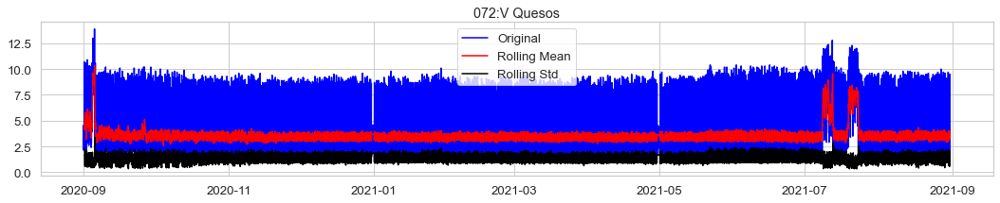

Test Statistic                -1.081656e+01
p-value                        1.850794e-19
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


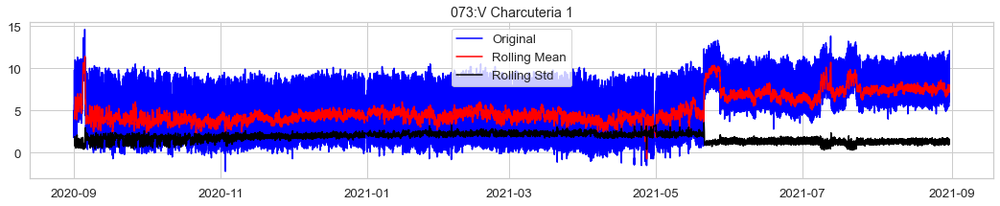

Test Statistic                -6.024964e+00
p-value                        1.463359e-07
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


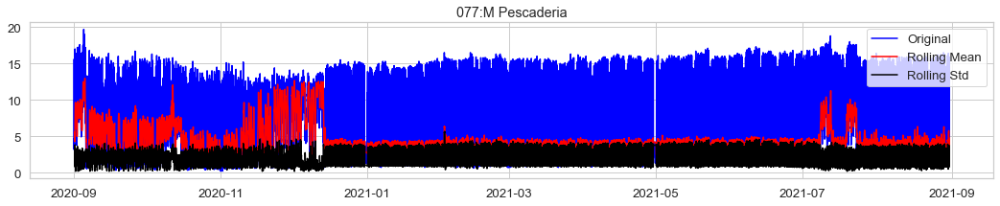

Test Statistic                -1.786788e+01
p-value                        3.035626e-30
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


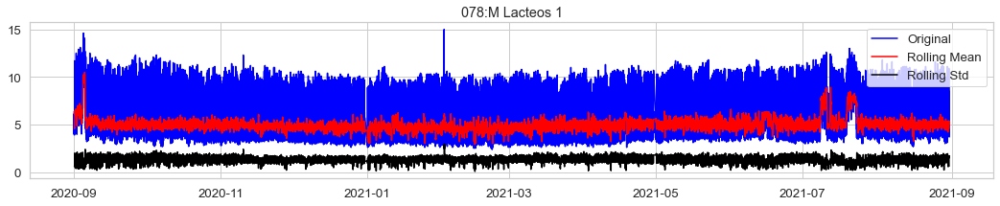

Test Statistic                -1.364393e+01
p-value                        1.633170e-25
#Lags Used                     5.500000e+01
Number of Observations Used    5.206300e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


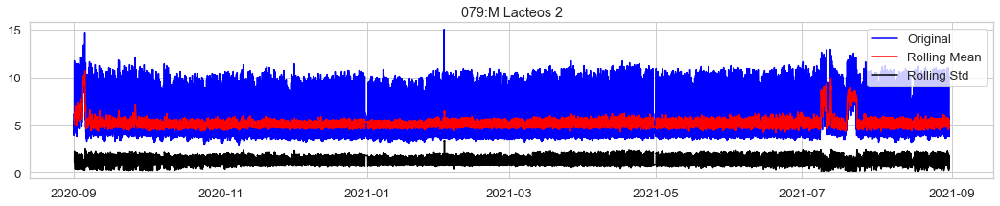

Test Statistic                -1.077199e+01
p-value                        2.371374e-19
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


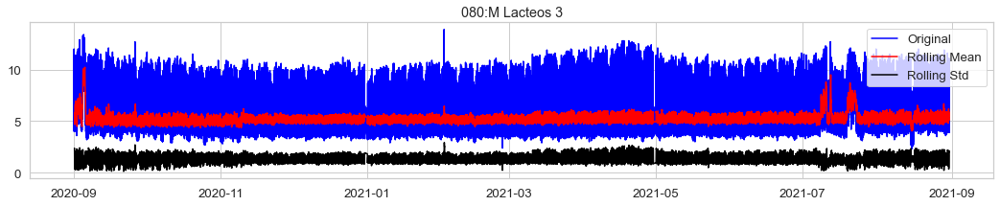

Test Statistic                -1.351164e+01
p-value                        2.845790e-25
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


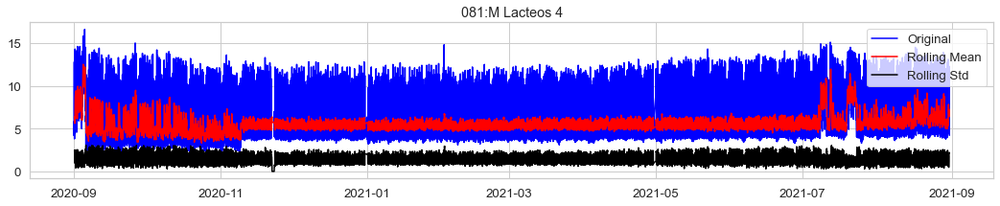

Test Statistic                   -20.984762
p-value                            0.000000
#Lags Used                        58.000000
Number of Observations Used    52060.000000
Critical Value (1%)               -3.430476
Critical Value (5%)               -2.861596
Critical Value (10%)              -2.566800
dtype: float64


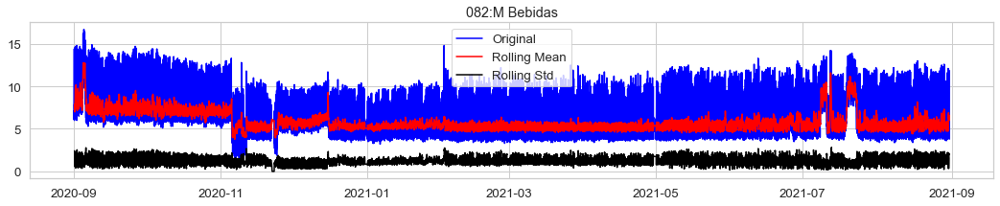

Test Statistic                -9.358581e+00
p-value                        7.935519e-16
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


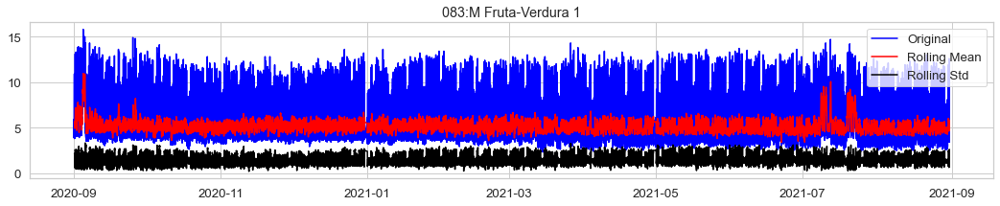

Test Statistic                   -19.218101
p-value                            0.000000
#Lags Used                        58.000000
Number of Observations Used    52060.000000
Critical Value (1%)               -3.430476
Critical Value (5%)               -2.861596
Critical Value (10%)              -2.566800
dtype: float64


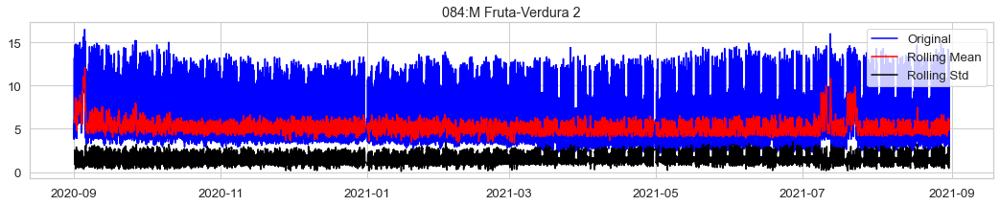

Test Statistic                -1.750134e+01
p-value                        4.383786e-30
#Lags Used                     5.800000e+01
Number of Observations Used    5.206000e+04
Critical Value (1%)           -3.430476e+00
Critical Value (5%)           -2.861596e+00
Critical Value (10%)          -2.566800e+00
dtype: float64


In [48]:
for censor in site_stat.columns:
    _ = plt.figure(figsize=(18,3))
    _ = plt.plot(site_stat[censor], color='blue',label='Original')
    _ = plt.plot(rollmean[censor], color='red',label='Rolling Mean')
    _ = plt.plot(rollstd[censor], color='black',label='Rolling Std')
    _ = plt.legend(loc='best')
    _ = plt.title(censor)
    plt.show()
    dftest = adfuller(site_stat[censor], autolag='AIC')
    dfoutput = pd.Series(dftest[0:4],
                         index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    

# Export to a clean dataset

In [89]:
site_stat

AssetName,011:CB CONG Hielo,012:I CONG PLS,013:I CONG Carne,014:CB CONG Ave,016:CB CONG PLS,017:I CONG PLS 2,018:I CONG Verdura,019:CB CONG Pescado,023:I CONG Pescaderia,057:M Charcuteria 1,...,072:V Quesos,073:V Charcuteria 1,077:M Pescaderia,078:M Lacteos 1,079:M Lacteos 2,080:M Lacteos 3,081:M Lacteos 4,082:M Bebidas,083:M Fruta-Verdura 1,084:M Fruta-Verdura 2
Timetag,,,,,,,,,,,,,,,,,,,,,
2020-09-01 00:05:00,-17.9,-19.6,-19.8,-13.8,-17.7,-18.0,-21.2,-18.8,-19.6,3.7,...,2.5,3.8,4.6,4.6,5.1,4.6,5.8,7.1,4.9,4.9
2020-09-01 00:15:00,-18.9,-21.8,-21.5,-13.8,-17.4,-19.1,-20.4,-18.2,-20.5,2.8,...,4.4,3.5,4.6,4.6,4.7,4.3,5.5,6.7,3.9,4.9
2020-09-01 00:25:00,-18.9,-22.1,-21.5,-13.0,-19.0,-19.1,-20.7,-18.2,-20.2,2.1,...,2.7,3.0,4.2,4.3,4.7,4.6,5.5,6.7,4.4,4.6
2020-09-01 00:35:00,-19.9,-22.5,-22.1,-13.4,-19.0,-20.5,-21.5,-19.2,-19.2,3.2,...,2.7,1.8,3.6,6.1,4.2,4.6,4.9,6.3,5.2,5.0
2020-09-01 00:45:00,-20.2,-21.5,-21.6,-14.1,-17.9,-21.0,-22.3,-20.2,-18.8,3.2,...,4.1,3.9,3.3,4.0,3.9,9.5,4.2,6.6,5.8,3.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-30 23:15:00,-21.9,-25.2,-21.4,-21.0,-17.1,-22.2,-26.6,-18.9,-18.7,3.0,...,2.7,9.3,4.0,6.2,4.2,5.1,4.7,6.1,4.1,3.3
2021-08-30 23:25:00,-20.9,-21.6,-20.2,-18.0,-14.1,-20.1,-25.0,-18.6,-19.7,4.1,...,1.6,8.0,1.7,5.5,4.9,6.6,6.3,3.8,3.4,6.0
2021-08-30 23:35:00,-21.3,-25.0,-21.5,-19.9,-18.5,-22.1,-27.1,-17.9,-21.1,4.1,...,3.1,10.4,3.4,4.7,4.4,4.7,6.3,4.5,3.4,5.2


In [90]:
df = site_stat.reset_index()

In [91]:
site_clean =(df.set_index(["Timetag"])
         .stack()
         .reset_index(name='DataValue')
         .rename(columns={'level_2':'AssetName'}))

In [92]:
site_clean

,Timetag,AssetName,DataValue
0,2020-09-01 00:05:00,011:CB CONG Hielo,-17.9
1,2020-09-01 00:05:00,012:I CONG PLS,-19.6
2,2020-09-01 00:05:00,013:I CONG Carne,-19.8
3,2020-09-01 00:05:00,014:CB CONG Ave,-13.8
4,2020-09-01 00:05:00,016:CB CONG PLS,-17.7
...,...,...,...
1719922,2021-08-30 23:55:00,080:M Lacteos 3,5.3
1719923,2021-08-30 23:55:00,081:M Lacteos 4,4.2
1719924,2021-08-30 23:55:00,082:M Bebidas,4.2
1719925,2021-08-30 23:55:00,083:M Fruta-Verdura 1,6.1


In [93]:
site_clean.to_csv('Data\Processed\Aulaga_clean.csv')